# Goal of this analysis is to figure out if temperature is the factor that impact transmission rate of Covid-19

I'm going to use the 2 datasets  <br>
1. Covid-19 cases from 22nd January 2020 to 18th June 2020 <br>
2. Global Land Temperature from 1st November 1743 to 2013-09-01

# Load Libraries

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "svg"

import warnings
warnings.filterwarnings("ignore")

# Load Dataset

In [2]:
# Full Covid-19 data
full_data = pd.read_csv("covid_19_clean_complete.csv")

# By Country, grouped by day
full_grouped = pd.read_csv("full_grouped.csv")

# Country wise
country_wise = pd.read_csv("country_wise_latest.csv")

# Global land Temperature by Country
temp_country = pd.read_csv("GlobalLandTemperaturesByCountry.csv")

# Confirmed Cases Globally

Let's first see the pandemic geographically

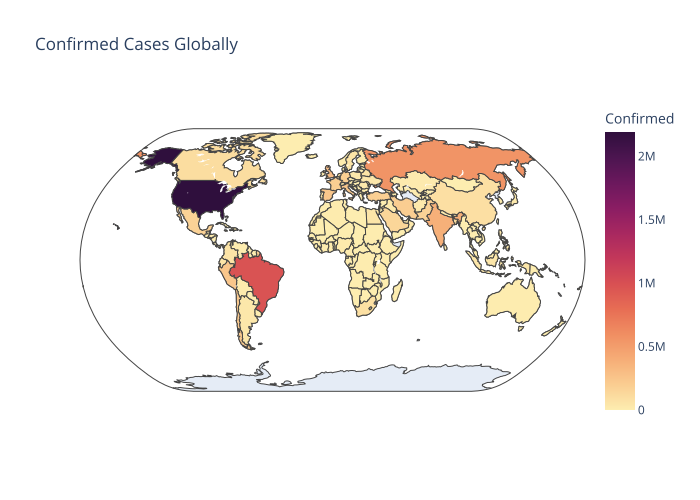

In [3]:
fig = px.choropleth(country_wise, locations="Country/Region", locationmode='country names', color='Confirmed', 
                    hover_name='Country/Region', title='Confirmed Cases Globally', hover_data = ['Confirmed'],
                    color_continuous_scale='matter', projection='natural earth')
fig.show("svg")

Now See how fast COVID-19 pandemic spread over time

In [4]:
px.bar(full_grouped, x="Date", y="Confirmed", color="Country/Region", height=700, title = "Confirmed",
      color_discrete_sequence=px.colors.qualitative.Vivid)

Graph looks like exponential growth So let's use the exponential growth function

Exponential Function is : N(t) = N0*e^(at)  <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;N(t) is confirmed cases at time t <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;N0 is the initial number of case at time 0 <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;a is contant rate <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;t is time

Dividing both sides by N0 then take the natural log of both sides, then I get <br>
ln(N(t) / N0) = at <br>
By calculating left hand side, we can get a constant rate for each country's infective rate

In [5]:
# Setting N0 for each country
for country in full_grouped['Country/Region'].unique():  
    for index, num in full_grouped[full_grouped['Country/Region'] == country]['Confirmed'].iteritems():
        if num > 0:
            full_grouped.loc[full_grouped['Country/Region']==country , 'N0'] = num
            full_grouped.loc[index, 'time'] = 0
            break            

# Setting time for each country
for country in full_grouped['Country/Region'].unique():
    t_count = 0
    check1 = True
    check2 = False
    for index, t in full_grouped[full_grouped['Country/Region'] == country]['time'].iteritems():
        if (not np.isnan(t)) & check1:
            check2 = True
            check1 = False
        if check2:
            full_grouped.loc[index, 'time'] = t_count
            t_count += 1
            
# Calculate natural log number
full_grouped['Natural Log'] = np.log(full_grouped['Confirmed'] / full_grouped['N0'])

# Calculate rate
full_grouped['RoC'] = full_grouped['Natural Log'] / full_grouped['time']

#Calculate Average rate by country
to_roc = full_grouped.copy()
to_roc = to_roc.dropna(subset = ['RoC'])
to_roc = to_roc.groupby(['Country/Region'])['RoC'].mean().reset_index()

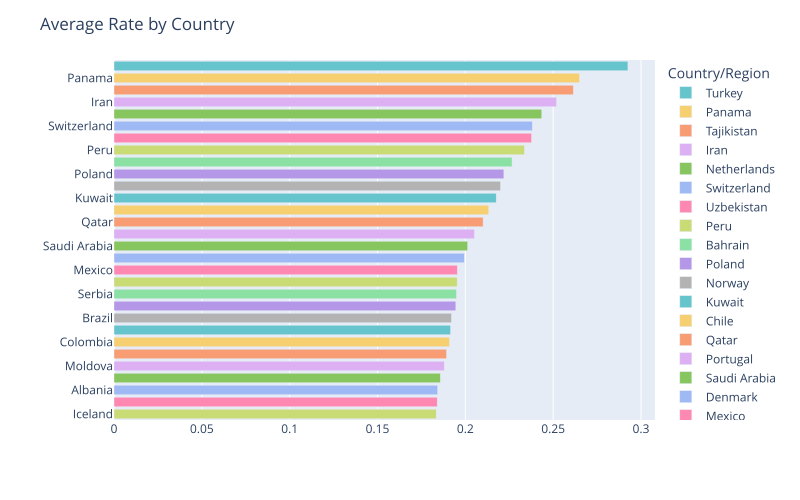

In [6]:
# Visualization
fig = px.bar(to_roc.sort_values('RoC', ascending=False).head(30), 
                 x='RoC', y="Country/Region", color='Country/Region',  
                 text='RoC', orientation='h', width=800,
                 color_discrete_sequence = px.colors.qualitative.Pastel)
fig.update_layout(title='Average Rate by Country', xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
fig.show("svg")

Change of rate over time

In [7]:
chg_rate = full_grouped.copy()
chg_rate = chg_rate.dropna(subset = ['time'])
px.bar(chg_rate, x="time", y="RoC", color="Country/Region", height=600, title = "Change of rate over time",
     color_discrete_sequence=px.colors.qualitative.Vivid)

Top 10 High Rate Country

In [8]:
to_roc.sort_values('RoC', ascending=False).head(10).reset_index(drop=True).style.background_gradient(cmap='Greys')

,Country/Region,RoC
0,Turkey,0.292571
1,Panama,0.265046
2,Tajikistan,0.261475
3,Iran,0.251951
4,Netherlands,0.243536
5,Switzerland,0.238110
6,Uzbekistan,0.237714
7,Peru,0.233684
8,Bahrain,0.226599
9,Poland,0.221955


Now it's time to take a look at the land temperature

# Global Land Temperature

Squeezing the date range in Feb to May since COVID-19 cases dataset is from 22nd January 2020 to 18th June 2020

In [9]:
temp_country['dt'] = pd.to_datetime(temp_country['dt'])
temp_country['dt'] = temp_country.loc[(temp_country['dt'].dt.month==2) | (temp_country['dt'].dt.month==3) | 
                                      (temp_country['dt'].dt.month==4) | (temp_country['dt'].dt.month==5), 'dt']
temp_country = temp_country[pd.notnull(temp_country['dt'])]

In [10]:
countries = np.array(temp_country['Country'].unique())

In [11]:
# Merge same countries
temp_country = temp_country.replace(['Denmark (Europe)', 'France (Europe)', 'Netherlands (Europe)', 'United Kingdom (Europe)'],
   ['Denmark', 'France', 'Netherlands', 'United Kingdom'])

# Remove unnecessary land - Antarctica
temp_country = temp_country[temp_country.Country != 'Antarctica']

# Fill missing values with mean temperature by country
for country in countries:
    mean_temp = temp_country.loc[temp_country['Country'] == country, 'AverageTemperature'].mean()
    temp_country.loc[(temp_country['Country'] == country) & (np.isnan(temp_country['AverageTemperature'])), 'AverageTemperature'] = mean_temp
    

temp_country = temp_country[['Country', 'AverageTemperature']].groupby(['Country'], as_index=False).mean()  

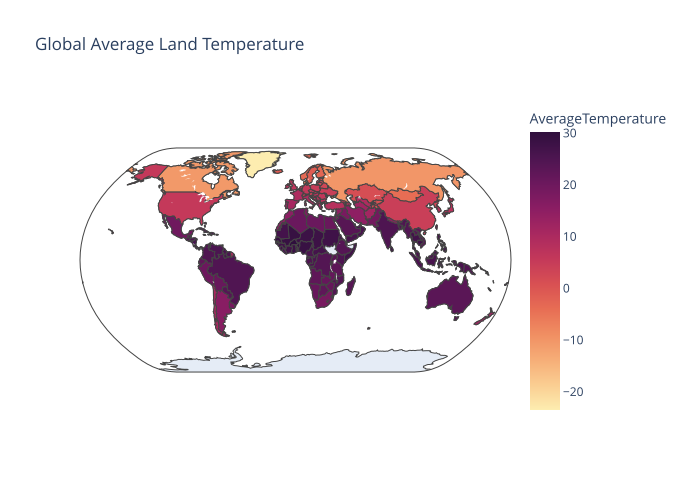

In [12]:
fig = px.choropleth(temp_country, locations="Country", locationmode='country names', color='AverageTemperature', 
                    hover_name='Country', title='Global Average Land Temperature', hover_data = ['AverageTemperature'],
                    color_continuous_scale='matter', projection='natural earth')
fig.show("svg")

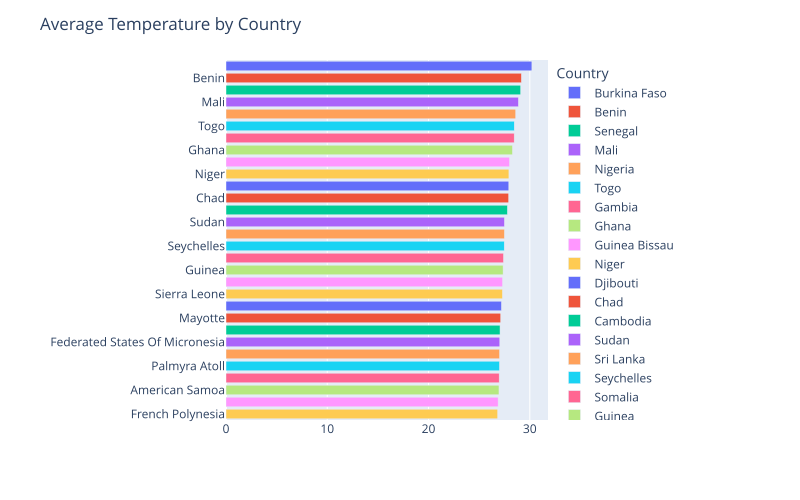

In [13]:
# Average Land Temperature by Country
fig = px.bar(temp_country.sort_values('AverageTemperature', ascending=False).head(30), 
                 x='AverageTemperature', y="Country", color='Country',  
                 text='AverageTemperature', orientation='h', width=800,
                 color_discrete_sequence = px.colors.qualitative.Plotly)
fig.update_layout(title='Average Temperature by Country', xaxis_title="", yaxis_title="", 
                      yaxis_categoryorder = 'total ascending',
                      uniformtext_minsize=8, uniformtext_mode='hide')
fig.show("svg")

In [14]:
# Top 10 Land Temperature by Country
temp_country.sort_values('AverageTemperature', ascending=False).head(11).reset_index(drop=True).style.background_gradient(cmap='RdYlGn_r')

,Country,AverageTemperature
0,Burkina Faso,30.208855
1,Benin,29.170539
2,Senegal,29.102505
3,Mali,28.875483
4,Nigeria,28.614434
5,Togo,28.465495
6,Gambia,28.459759
7,Ghana,28.289020
8,Guinea Bissau,27.999924
9,Niger,27.939724


Categorize Countries into 4 ranges

In [15]:
pd.qcut(temp_country['AverageTemperature'], 4).unique()

[(8.14, 22.784], (22.784, 25.909], (25.909, 30.209], (-23.526, 8.14]]
Categories (4, interval[float64]): [(-23.526, 8.14] < (8.14, 22.784] < (22.784, 25.909] < (25.909, 30.209]]

Let's compare rate and temperature

In [16]:
roc_temp = to_roc.copy()
roc_temp.rename(columns = {'Country/Region' : 'Country'}, inplace=True)

In [17]:
roc_temp['Country'] = roc_temp['Country'].replace('Antigua and Barbuda', 'Antigua And Barbuda')
roc_temp['Country'] = roc_temp['Country'].replace('Bosnia and Herzegovina', 'Bosnia And Herzegovina')
roc_temp['Country'] = roc_temp['Country'].replace('Cabo Verde', 'Cape Verde')
roc_temp['Country'] = roc_temp['Country'].replace('Czechia', 'Czech Republic')
roc_temp['Country'] = roc_temp['Country'].replace("Cote d'Ivoire", "Côte D'Ivoire")
roc_temp['Country'] = roc_temp['Country'].replace("Congo (Brazzaville)", "Congo")
roc_temp['Country'] = roc_temp['Country'].replace("Congo (Kinshasa)", "Congo (Democratic Republic Of The)")
roc_temp['Country'] = roc_temp['Country'].replace("Eswatini", "Swaziland")
roc_temp['Country'] = roc_temp['Country'].replace("Guinea-Bissau", "Guinea Bissau")
roc_temp['Country'] = roc_temp['Country'].replace("Taiwan*", "Taiwan")
roc_temp['Country'] = roc_temp['Country'].replace("North Macedonia", "Macedonia")
roc_temp['Country'] = roc_temp['Country'].replace("Saint Kitts and Nevis", "Saint Kitts And Nevis")
roc_temp['Country'] = roc_temp['Country'].replace("Sao Tome and Principe", "Sao Tome And Principe")
roc_temp['Country'] = roc_temp['Country'].replace("South Sudan", "Sudan")
roc_temp['Country'] = roc_temp['Country'].replace("Saint Vincent and the Grenadines", "Saint Vincent And The Grenadines")
roc_temp['Country'] = roc_temp['Country'].replace("US", "United States")
roc_temp['Country'] = roc_temp['Country'].replace("Timor-Leste", "Timor Leste")
roc_temp['Country'] = roc_temp['Country'].replace("Trinidad and Tobago", "Trinidad And Tobago")
roc_temp['Country'] = roc_temp['Country'].replace("West Bank and Gaza", "Trinidad And Tobago")

roc_temp = roc_temp.merge(temp_country, how="left", on = "Country")

roc_temp.loc[roc_temp['Country'] == 'Brunei', 'AverageTemperature'] = 27
roc_temp.loc[roc_temp['Country'] == 'Holy See', 'AverageTemperature'] = 15.6
roc_temp.loc[roc_temp['Country'] == 'Kosovo', 'AverageTemperature'] = 9.5
roc_temp.loc[roc_temp['Country'] == 'Maldives', 'AverageTemperature'] = 27.75

In [18]:
# Mapping AverageTemperature into numerical values

roc_temp.loc[roc_temp['AverageTemperature'] <= 8.14, 'TempZone'] = 1
roc_temp.loc[(roc_temp['AverageTemperature'] > 8.14) & (roc_temp['AverageTemperature'] <= 22.784), 'TempZone'] = 2
roc_temp.loc[(roc_temp['AverageTemperature'] > 22.784) & (roc_temp['AverageTemperature'] <= 25.909), 'TempZone'] = 3
roc_temp.loc[roc_temp['AverageTemperature'] > 25.909, 'TempZone'] = 4
roc_temp['TempZone'] = roc_temp['TempZone'].astype(int)

Check each TempZone's average rate

In [19]:
roc_temp.groupby(['TempZone'])['RoC'].mean().reset_index()

,TempZone,RoC
0,1,0.150351
1,2,0.131269
2,3,0.129162
3,4,0.112960


Infection Rate is getting higher as it goes to TempZone 1 <br>
This tells us that Coronavirus spread more quickly in lower temperature area and spread slowly in higher temperature area

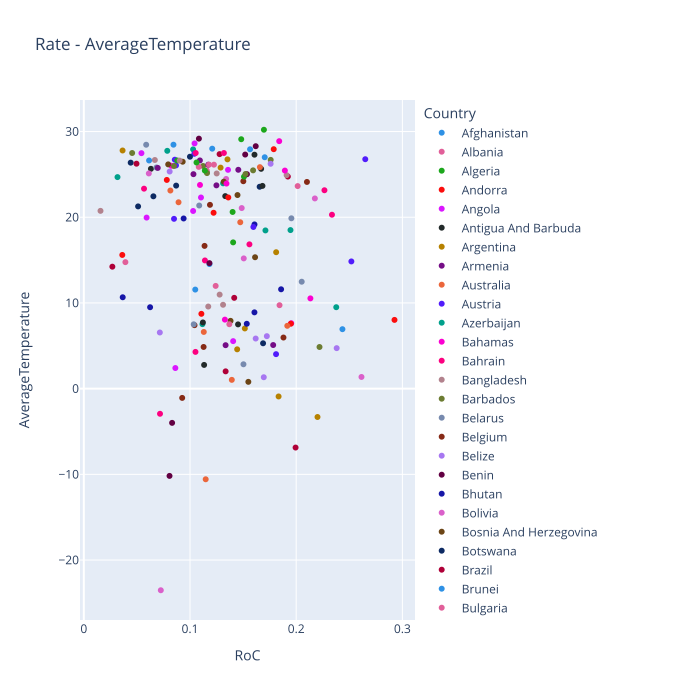

In [20]:
# RoC vs AverageTemperature Graph
fig = px.scatter(roc_temp, x='RoC', y='AverageTemperature', color = 'Country', height = 700,
                title = "Rate - AverageTemperature",
                color_discrete_sequence=px.colors.qualitative.Dark24)
fig.show("svg")

# Summary

1. Temperature is one of the key factors for the Coronavirus to thrive <br>
2. Coronavirus spread fast at temperate of lower than 8 degree Celcisus 
3. Coronavirus spread slow at temperate of higher than 26 degree Celcius <br>
3. Infection rate is closely related to the climate